## 1. Camera Calibration
This section will calculate the camera calibration parameters from a set of images of a checkerboard taken with the camera at different angles. Since the checkerboard has a well known pattern with equal distances of the detected intersections, the parameters can be mathematically calculated that cause the distortion.

In [29]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import pickle
%matplotlib inline

nx = 9 # the number of inside corners in x
ny = 6 # the number of inside corners in y

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

img = cv2.imread(images[0])  # Use first image
img_size = (img.shape[1], img.shape[0])

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

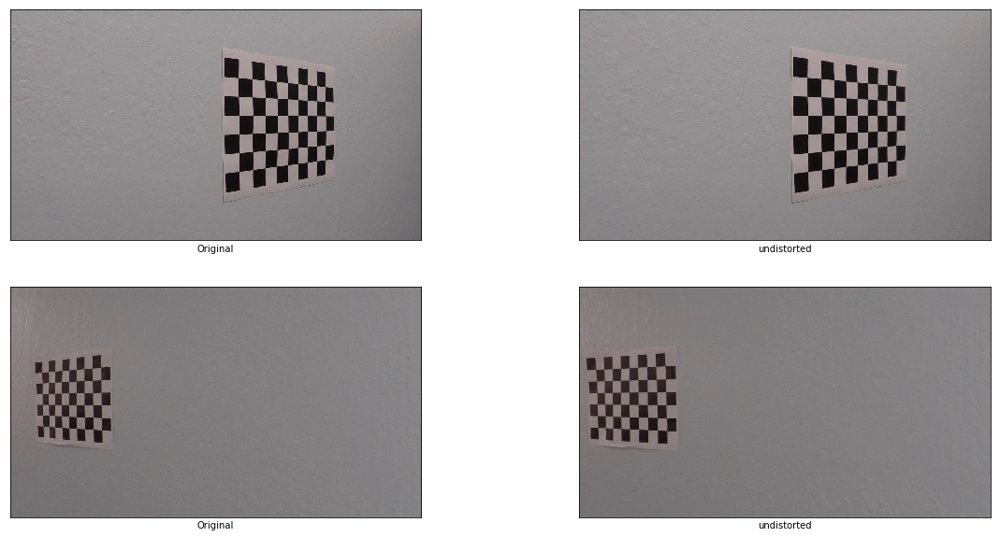

In [30]:
plt.figure(figsize=(20,10))
for i in range(2):
    choice = np.random.choice(images)
    image = cv2.imread(choice)
    plt.subplot(2,2, i*2 + 1)
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.xlabel('Original')
    plt.subplot(2,2, i*2 + 2)
    undistorted = cv2.undistort(image, mtx, dist, None, mtx)
    plt.imshow(undistorted)
    plt.xticks([])
    plt.yticks([])
    plt.xlabel('undistorted')

plt.show()

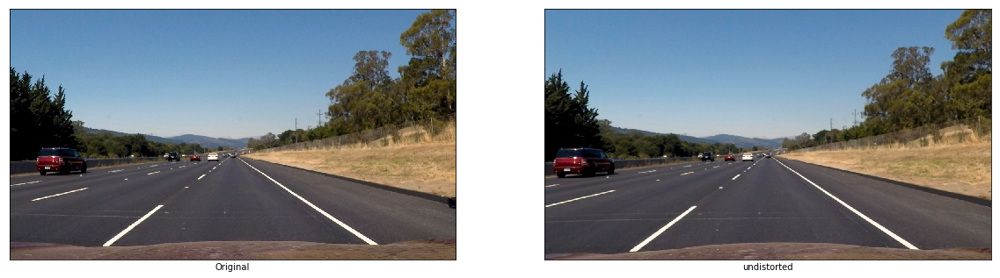

In [31]:

import matplotlib.image as mpimg
test_images = glob.glob('test_images/straight_lines*.jpg')
plt.figure(figsize=(20,20))
for i in range(1):
    choice = np.random.choice(test_images)
    image = mpimg.imread(choice)
    plt.subplot(2,2, i*2 + 1)
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.xlabel('Original')
    plt.subplot(2,2, i*2 + 2)
    undistorted = cv2.undistort(image, mtx, dist, None, mtx)
    plt.imshow(undistorted)
    plt.xticks([])
    plt.yticks([])
    plt.xlabel('undistorted')
    #mpimg.imsave( choice + '_u', undistorted)

plt.show()


Same images after perspective transformation:

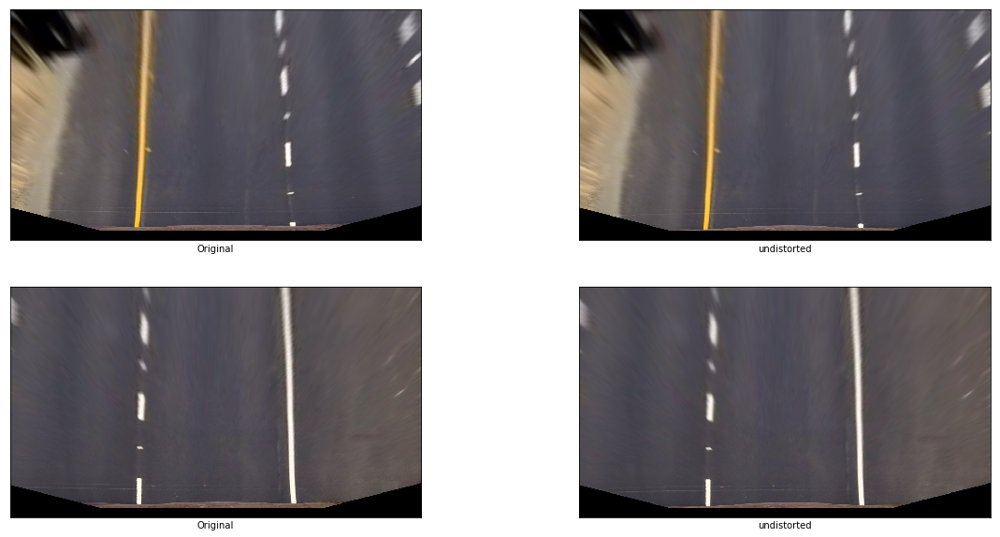

In [47]:
srcPts = np.float32([
    [871, 565],   # top right
    [1042, 676],  # bottom, right
    [279, 676],   # bottom, left
    [432, 565]    # top left
])

dstPts = np.float32([
    [880, 600],   # top right
    [880, 676],  # bottom, right
    [400, 676],   # bottom, left
    [400, 600]    # top left
])

# srcPts = np.float32([
#     [664, 440],   # top right
#     [1045, 676],  # bottom, right
#     [267, 676],   # bottom, left
#     [613, 440]    # top left
# ])

# dstPts = np.float32([
#     [850, 0],   # top right
#     [890, 676],  # bottom, right
#     [380, 676],   # bottom, left
#     [410, 0]    # top left
# ])

M = cv2.getPerspectiveTransform(srcPts, dstPts)
Minv = cv2.getPerspectiveTransform(dstPts, srcPts)


import matplotlib.image as mpimg
test_images = glob.glob('test_images/straight_lines*.jpg')
plt.figure(figsize=(20,10))
for i in range(2):
    choice = test_images[i]
    image = mpimg.imread(choice)
    img_size = (image.shape[1], image.shape[0])
    plt.subplot(2,2, i*2 + 1)
    warped_image = cv2.warpPerspective(image, M, img_size, flags=cv2.INTER_LINEAR)
    plt.imshow(warped_image)
    plt.xticks([])
    plt.yticks([])
    plt.xlabel('Original')
    plt.subplot(2,2, i*2 + 2)
    undistorted = cv2.undistort(image, mtx, dist, None, mtx)
    warped_undistorted = cv2.warpPerspective(undistorted, M, img_size, flags=cv2.INTER_LINEAR)
    plt.imshow(warped_undistorted)
    plt.xticks([])
    plt.yticks([])
    plt.xlabel('undistorted')

plt.show()


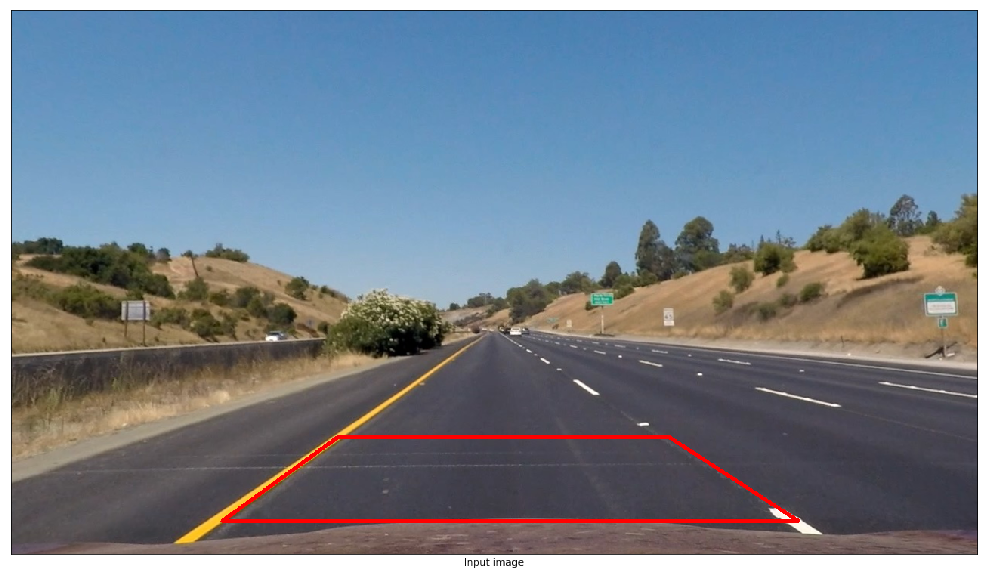

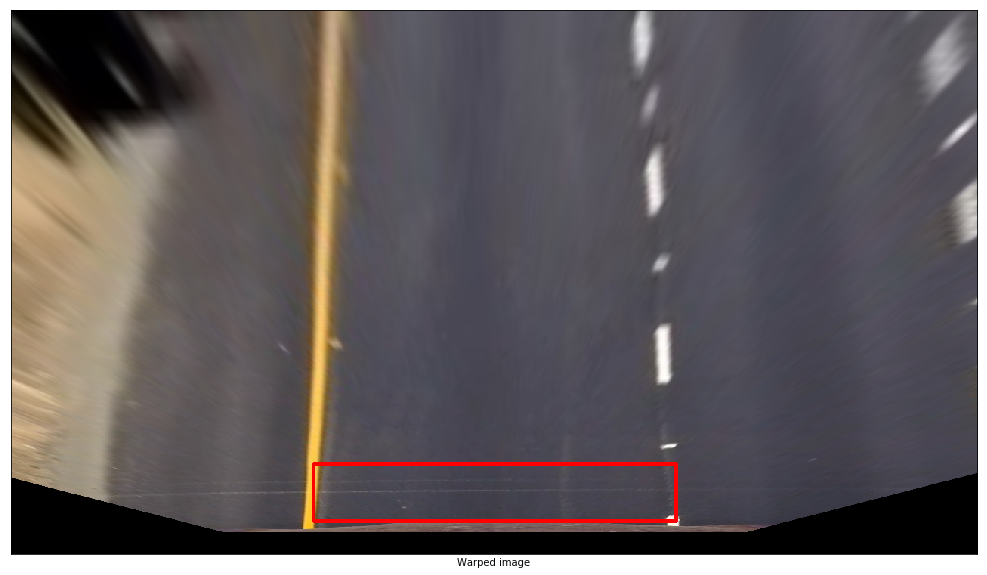

In [48]:
import glob, cv2
import matplotlib.image as mpimg
test_images = glob.glob('test_images/straight_lines*.jpg')
input_img = mpimg.imread(test_images[0])
input_img = cv2.undistort(input_img, mtx, dist, None, mtx) # Undistort

srcPts = np.int32([
    [871, 565],   # top right
    [1042, 676],  # bottom, right
    [279, 676],   # bottom, left
    [432, 565]    # top left
])

dstPts = np.int32([
    [880, 600],   # top right
    [880, 676],  # bottom, right
    [400, 676],   # bottom, left
    [400, 600]    # top left
])


img = cv2.polylines(input_img.copy(),[srcPts],True,(255,0,0), thickness=3)
# Plot
plt.figure(figsize=(20,10))
plt.imshow(img)
plt.xticks([])
plt.yticks([])
plt.xlabel('Input image')
plt.show()


warped_image = cv2.warpPerspective(input_img.copy(), M, img_size, flags=cv2.INTER_LINEAR)
img = cv2.polylines(warped_image,[dstPts],True,(255,0,0), thickness=3)
plt.figure(figsize=(20,10))
plt.xticks([])
plt.yticks([])
plt.xlabel('Warped image')
plt.imshow(warped_image)
plt.show()



## 2. Thresholding

In this step I will use binary thresholding to extract the possible lane markings. This image then can be perspective transformed to identify the actual lane markings.

In [49]:
import cv2
import numpy as np

# Define a function that takes an image, gradient orientation,
# and threshold min / max values.
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Return the result
    return binary_output

# Define a function to threshold an image for a given range and Sobel kernel
def dir_thresh(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

# Define a function to return the magnitude of the gradient
# for a given sobel kernel size and threshold values
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

def color_thresh(img, thresh=(0,255)):
    # Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= thresh[0]) & (s_channel <= thresh[1])] = 1
    return s_binary

In [50]:
def pipeline(image):
    image = cv2.undistort(image, mtx, dist, None, mtx) # Undistort

    gradx = abs_sobel_thresh(image, orient='x', thresh_min=25, thresh_max=250)
    grady = abs_sobel_thresh(img, orient='y', thresh_min=25, thresh_max=50)
    mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(70, 255))
    dir_binary = dir_thresh(image, sobel_kernel=15, thresh=(0.7, 1.3))
    color_binary = color_thresh(image, thresh=(170, 255))

    # Combine direction and magnitude to gradients with the thresholded HLS image
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1)) | (((color_binary == 1) & (dir_binary == 1)))] = 1
    return combined

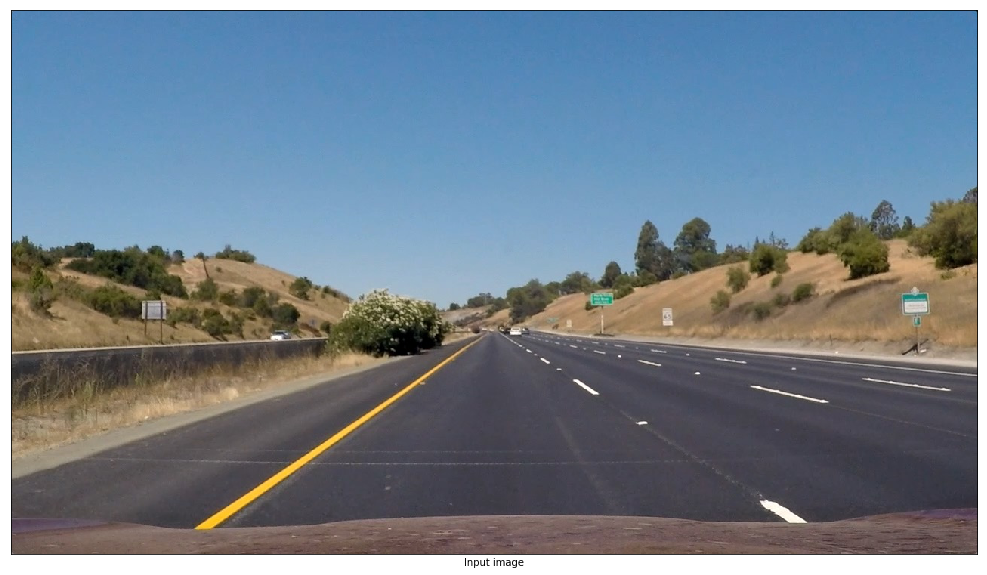

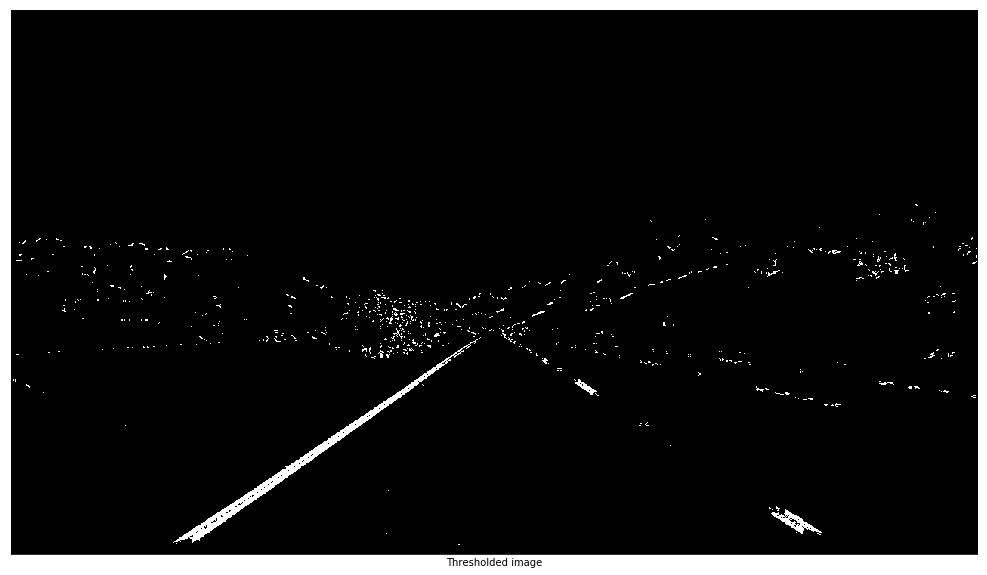

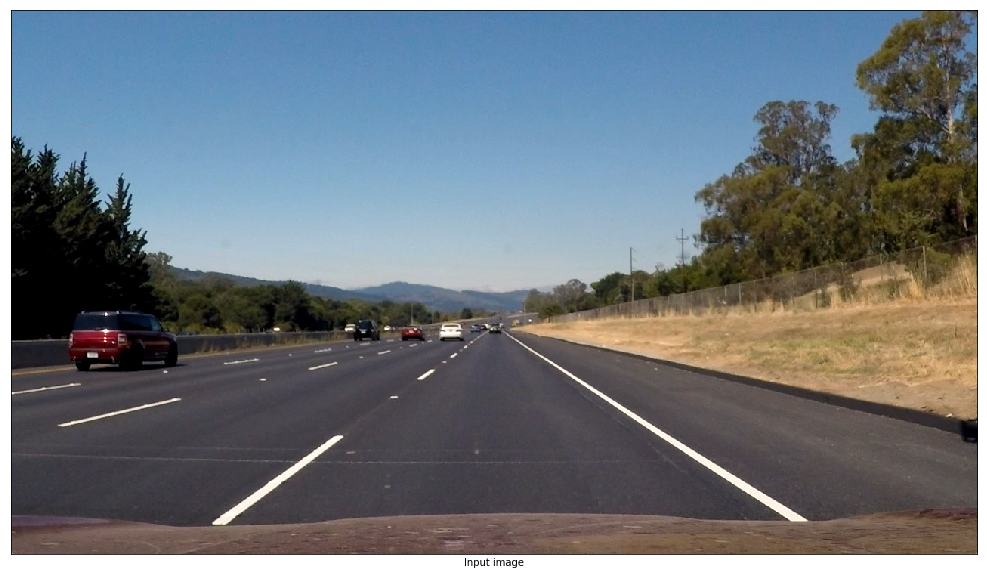

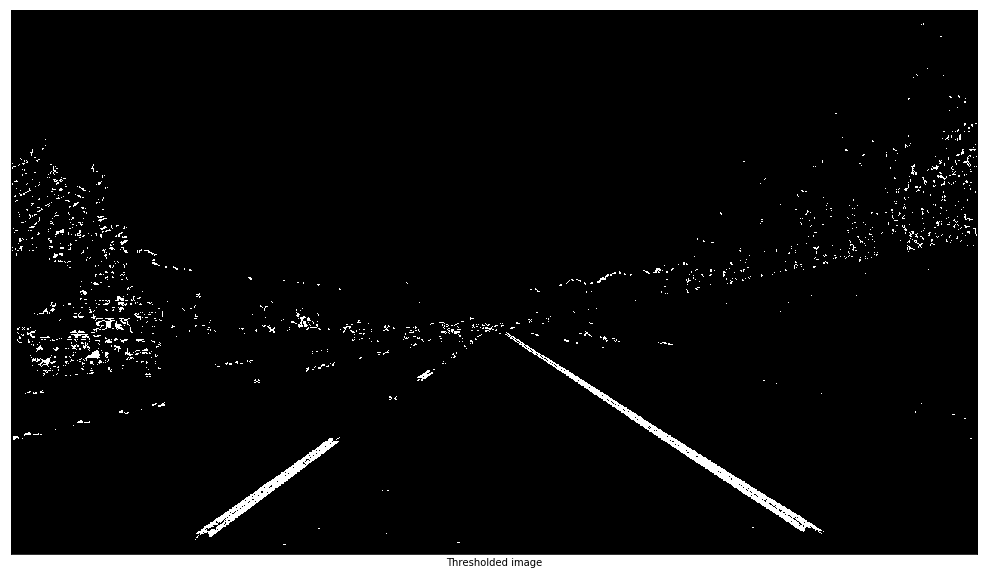

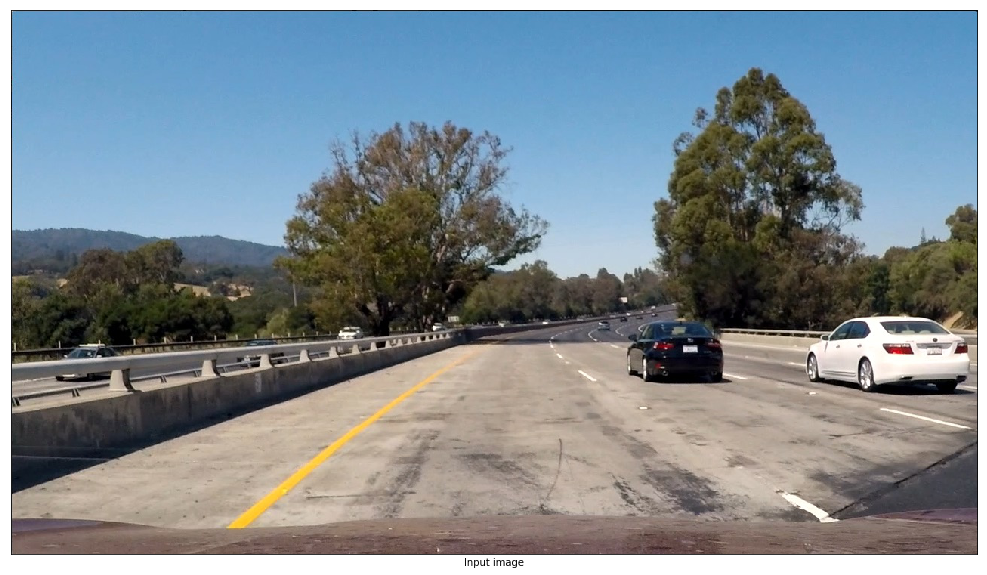

...

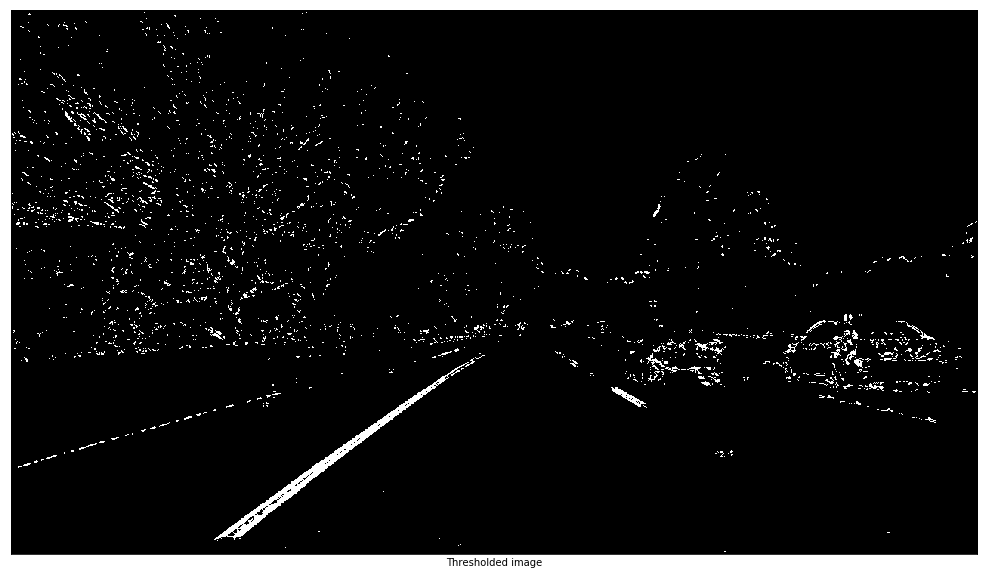

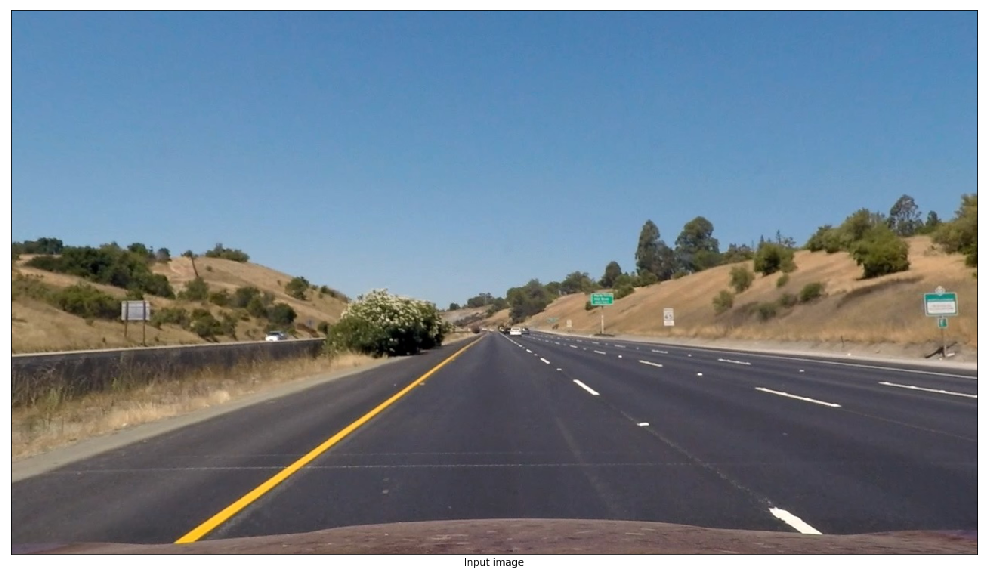

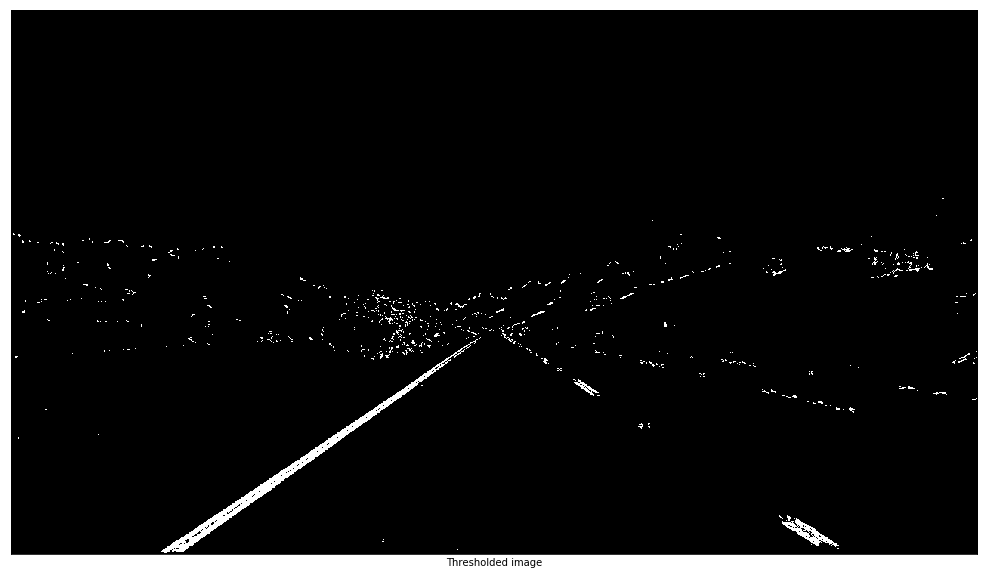

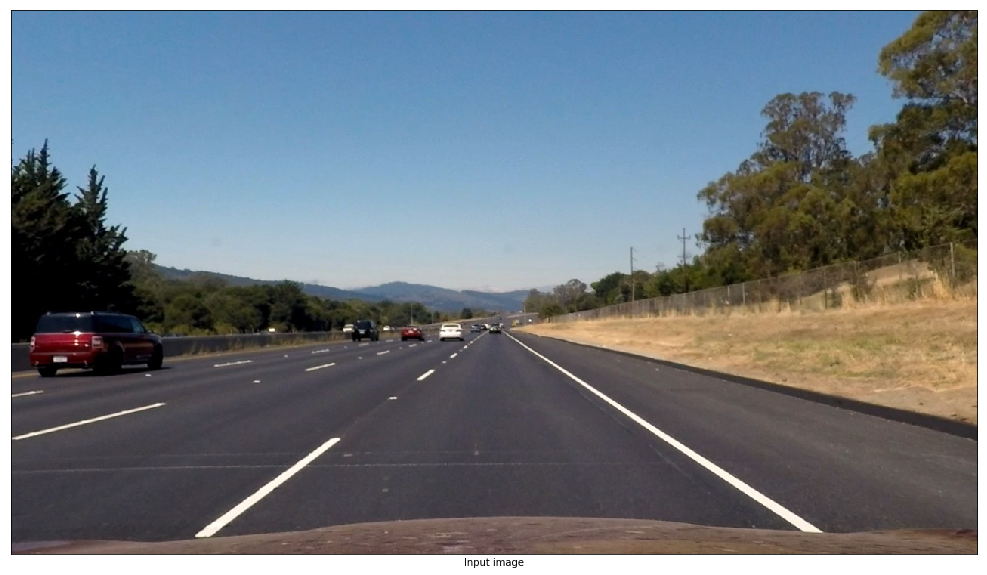

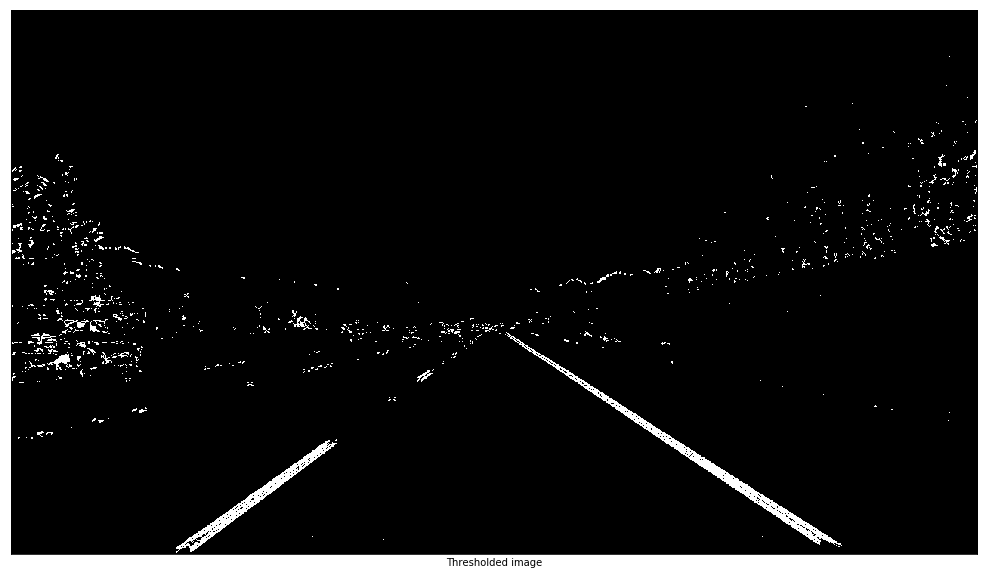

In [51]:
import matplotlib.image as mpimg
test_images = glob.glob('test_images/*.jpg')
for image_path in test_images:
    image = mpimg.imread(image_path)
    thresholded = pipeline(image)
    # Input image
    plt.figure(figsize=(20,10))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.xlabel('Input image')
    plt.show()

    # Thresholded image
    plt.figure(figsize=(20,10))
    plt.imshow(thresholded, cmap="gray")
    plt.xticks([])
    plt.yticks([])
    plt.xlabel('Thresholded image')
    plt.show()

## Identifying lane-lines

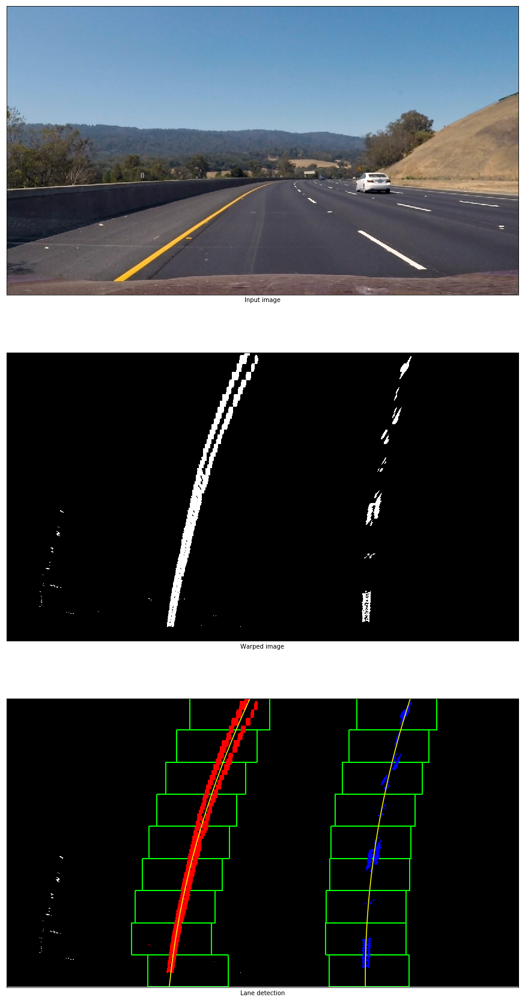

In [52]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

test_images = glob.glob('test_images/*.jpg')
image = mpimg.imread(test_images[4])

undistorted = cv2.undistort(image, mtx, dist, None, mtx) # Undistort

binary_image = pipeline(image).astype(np.uint8)
binary_warped = cv2.warpPerspective(binary_image, M, img_size, flags=cv2.INTER_LINEAR)

# Assuming you have created a warped binary image called "binary_warped"
# Take a histogram of the bottom half of the image
half = int(binary_warped.shape[0]/2)
histogram = np.sum(binary_warped[half:,:], axis=0)
# Create an output image to draw on and  visualize the result
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

# Choose the number of sliding windows
nwindows = 9
# Set height of windows
window_height = np.int(binary_warped.shape[0]/nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = binary_warped.shape[0] - (window+1)*window_height
    win_y_high = binary_warped.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

plt.figure(figsize=(20,30))
plt.subplot(3,1,1)
plt.xticks([])
plt.yticks([])
plt.xlabel('Input image')
plt.imshow(image)
plt.subplot(3,1,2)
plt.xticks([])
plt.yticks([])
plt.xlabel('Warped image')
plt.imshow(binary_warped, cmap="gray")
plt.subplot(3,1,3)
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.xticks([])
plt.yticks([])
plt.xlabel('Lane detection')
plt.show()



### Curvature

In [53]:
y_eval = np.max(ploty)
left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
print('Left curve in rad:', left_curverad, 'Right curve in rad:', right_curverad)

# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

print(len(ploty),len(leftx),len(rightx))
# Fit new polynomials to x,y in world space
left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
# Calculate the new radii of curvature
left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
# Now our radius of curvature is in meters
print(left_curverad, 'm', right_curverad, 'm')

Left curve in rad: 2023.41168631 Right curve in rad: 2148.92697706
720 16912 3938
654.978655038 m 705.687977683 m


### Overlay

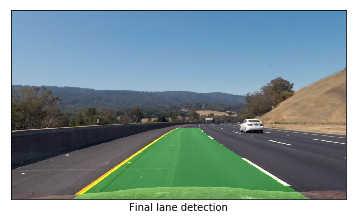

In [108]:
# Create an image to draw the lines on
warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

# Recast the x and y points into usable format for cv2.fillPoly()
pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
pts = np.hstack((pts_left, pts_right))

# Draw the lane onto the warped blank image
cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

# Warp the blank back to original image space using inverse perspective matrix (Minv)
newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
# Combine the result with the original image
result = cv2.addWeighted(undistorted, 1, newwarp, 0.3, 0)
plt.imshow(result)
plt.xticks([])
plt.yticks([])
plt.xlabel('Final lane detection')
plt.show()

## Final algorithm

In [111]:
def fast_detection(image):
    undistorted = cv2.undistort(image, mtx, dist, None, mtx) # Undistort
    binary_image = pipeline(image).astype(np.uint8)
    binary_warped = cv2.warpPerspective(binary_image, M, img_size, flags=cv2.INTER_LINEAR)
    
    left_fit = state['left_fit']
    right_fit = state['right_fit']
    # Searching withing previously found area
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 50
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    return left_fit, right_fit, binary_image, binary_warped

def sliding_window_detection(image):
    undistorted = cv2.undistort(image, mtx, dist, None, mtx) # Undistort

    binary_image = pipeline(image).astype(np.uint8)
    binary_warped = cv2.warpPerspective(binary_image, M, img_size, flags=cv2.INTER_LINEAR)

    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    half = int(binary_warped.shape[0]/2)
    histogram = np.sum(binary_warped[half:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    return left_fit, right_fit, binary_image, binary_warped


def curvature(binary_warped, left_fit, right_fit):
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    y_eval = np.max(ploty)
    left_curverad_pix = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad_pix = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    ##print('Left curve in rad:', left_curverad_pix, 'Right curve in rad:', right_curverad_pix)

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad_m = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad_m = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    ##print(left_curverad_m, 'm', right_curverad_m, 'm')
    return left_curverad_m, right_curverad_m, left_curverad_pix, right_curverad_pix
    
    
def overlay_lane(image, binary_warped, left_fit, right_fit):
    undistorted = cv2.undistort(image, mtx, dist, None, mtx) # Undistort
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undistorted, 1, newwarp, 0.3, 0)
    return result

def overlay_stats(image, left_fit, right_fit, left_curverad_m, right_curverad_m):
    # Define conversions in x from pixels space to centimeters
    xcm_per_pix = (3.7/700)*100 # meters per pixel in x dimension
    height = image.shape[0]
    vehicle_center_pix = image.shape[1]/2.0
    left = np.poly1d(left_fit)
    right = np.poly1d(right_fit)
    left_pix = left(height)
    right_pix = right(height)
    lane_center_pix = left_pix + (right_pix - left_pix)/2.0
    pos_from_center_pix = (lane_center_pix - vehicle_center_pix) # negative values for closeness to the left side
    cv2.putText(image,'From center: %0.2f cm' % (pos_from_center_pix * xcm_per_pix),(5,40), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2, cv2.LINE_AA)
    cv2.putText(image,'Radius of curvature: %0.2f m' % (left_curverad_m),(5,80), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2, cv2.LINE_AA)
    return image

def process_image(image):
    global state
    if 'left_fit' in state:
        left_fit, right_fit, binary_image, binary_warped = fast_detection(image)
    else:
        left_fit, right_fit, binary_image, binary_warped = sliding_window_detection(image)
    state['left_fit'] = left_fit
    state['right_fit'] = right_fit
    left_curverad_m, right_curverad_m, _, _, = curvature(binary_warped, left_fit, right_fit)
    image = overlay_lane(image, binary_warped, left_fit, right_fit)
    image = overlay_stats(image, left_fit, right_fit,left_curverad_m, right_curverad_m)
    return image


### Process video

In [112]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

in_video = 'project_video.mp4'
out_video = 'project_result.mp4'
state = {}
clip1 = VideoFileClip(in_video)
video_clip = clip1.fl_image(process_image) # This function expects color images
video_clip.write_videofile(out_video, audio=False)

[MoviePy] >>>> Building video project_result.mp4
[MoviePy] Writing video project_result.mp4









  0%|          | 0/1261 [00:00<?, ?it/s]






  0%|          | 1/1261 [00:00<05:43,  3.67it/s]






  0%|          | 2/1261 [00:00<05:31,  3.80it/s]






  0%|          | 3/1261 [00:00<05:26,  3.86it/s]






  0%|          | 4/1261 [00:01<05:24,  3.87it/s]






  0%|          | 5/1261 [00:01<05:22,  3.90it/s]






  0%|          | 6/1261 [00:01<05:15,  3.98it/s]






  1%|          | 7/1261 [00:01<05:11,  4.02it/s]






  1%|          | 8/1261 [00:01<05:09,  4.05it/s]






  1%|          | 9/1261 [00:02<05:05,  4.10it/s]






  1%|          | 10/1261 [00:02<05:03,  4.12it/s]






  1%|          | 11/1261 [00:02<05:04,  4.10it/s]






  1%|          | 12/1261 [00:02<05:05,  4.09it/s]






  1%|          | 13/1261 [00:03<05:08,  4.04it/s]






  1%|          | 14/1261 [00:03<05:07,  4.06it/s]






  1%|          | 15/1261 [00:03<05:05,  4.08it/s]






  1%|▏         | 16/1261 [00:03<05:06,  4.07it/s]






  1%|▏         | 17/1261 [00:04<05:10,  4.01it/s]






  1

  8%|▊         | 106/1261 [00:27<04:54,  3.93it/s]






  8%|▊         | 107/1261 [00:27<04:56,  3.89it/s]






  9%|▊         | 108/1261 [00:28<04:55,  3.90it/s]






  9%|▊         | 109/1261 [00:28<04:55,  3.90it/s]






  9%|▊         | 110/1261 [00:28<05:04,  3.78it/s]






  9%|▉         | 111/1261 [00:29<05:05,  3.76it/s]






  9%|▉         | 112/1261 [00:29<05:09,  3.71it/s]






  9%|▉         | 113/1261 [00:29<05:03,  3.78it/s]






  9%|▉         | 114/1261 [00:29<05:15,  3.63it/s]






  9%|▉         | 115/1261 [00:30<05:07,  3.72it/s]






  9%|▉         | 116/1261 [00:30<05:08,  3.72it/s]






  9%|▉         | 117/1261 [00:30<05:06,  3.73it/s]






  9%|▉         | 118/1261 [00:30<05:02,  3.77it/s]






  9%|▉         | 119/1261 [00:31<04:54,  3.88it/s]






 10%|▉         | 120/1261 [00:31<04:52,  3.90it/s]






 10%|▉         | 121/1261 [00:31<04:46,  3.98it/s]






 10%|▉         | 122/1261 [00:31<04:42,  4.03it/s]






 10%|▉         | 123/1261 [00:3

 17%|█▋        | 211/1261 [00:55<04:20,  4.03it/s]






 17%|█▋        | 212/1261 [00:55<04:19,  4.04it/s]






 17%|█▋        | 213/1261 [00:55<04:18,  4.06it/s]






 17%|█▋        | 214/1261 [00:55<04:21,  4.01it/s]






 17%|█▋        | 215/1261 [00:56<04:25,  3.95it/s]






 17%|█▋        | 216/1261 [00:56<04:26,  3.92it/s]






 17%|█▋        | 217/1261 [00:56<04:26,  3.92it/s]






 17%|█▋        | 218/1261 [00:57<04:25,  3.93it/s]






 17%|█▋        | 219/1261 [00:57<04:24,  3.93it/s]






 17%|█▋        | 220/1261 [00:57<04:33,  3.80it/s]






 18%|█▊        | 221/1261 [00:57<04:27,  3.89it/s]






 18%|█▊        | 222/1261 [00:58<04:28,  3.87it/s]






 18%|█▊        | 223/1261 [00:58<04:26,  3.89it/s]






 18%|█▊        | 224/1261 [00:58<04:28,  3.87it/s]






 18%|█▊        | 225/1261 [00:58<04:27,  3.87it/s]






 18%|█▊        | 226/1261 [00:59<04:24,  3.92it/s]






 18%|█▊        | 227/1261 [00:59<04:23,  3.93it/s]






 18%|█▊        | 228/1261 [00:5

 25%|██▌       | 316/1261 [01:22<04:02,  3.89it/s]






 25%|██▌       | 317/1261 [01:22<04:03,  3.87it/s]






 25%|██▌       | 318/1261 [01:22<04:05,  3.84it/s]






 25%|██▌       | 319/1261 [01:23<04:05,  3.83it/s]






 25%|██▌       | 320/1261 [01:23<04:05,  3.84it/s]






 25%|██▌       | 321/1261 [01:23<04:02,  3.87it/s]






 26%|██▌       | 322/1261 [01:23<03:58,  3.93it/s]






 26%|██▌       | 323/1261 [01:24<03:57,  3.95it/s]






 26%|██▌       | 324/1261 [01:24<03:59,  3.91it/s]






 26%|██▌       | 325/1261 [01:24<03:59,  3.91it/s]






 26%|██▌       | 326/1261 [01:25<03:57,  3.94it/s]






 26%|██▌       | 327/1261 [01:25<03:56,  3.95it/s]






 26%|██▌       | 328/1261 [01:25<03:59,  3.89it/s]






 26%|██▌       | 329/1261 [01:25<04:01,  3.86it/s]






 26%|██▌       | 330/1261 [01:26<03:59,  3.88it/s]






 26%|██▌       | 331/1261 [01:26<03:58,  3.89it/s]






 26%|██▋       | 332/1261 [01:26<03:56,  3.92it/s]






 26%|██▋       | 333/1261 [01:2

 33%|███▎      | 421/1261 [01:48<03:37,  3.86it/s]






 33%|███▎      | 422/1261 [01:49<03:43,  3.76it/s]






 34%|███▎      | 423/1261 [01:49<03:41,  3.78it/s]






 34%|███▎      | 424/1261 [01:49<03:40,  3.79it/s]






 34%|███▎      | 425/1261 [01:50<03:44,  3.72it/s]






 34%|███▍      | 426/1261 [01:50<03:46,  3.69it/s]






 34%|███▍      | 427/1261 [01:50<03:41,  3.77it/s]






 34%|███▍      | 428/1261 [01:50<03:39,  3.80it/s]






 34%|███▍      | 429/1261 [01:51<03:36,  3.84it/s]






 34%|███▍      | 430/1261 [01:51<03:42,  3.73it/s]






 34%|███▍      | 431/1261 [01:51<03:49,  3.62it/s]






 34%|███▍      | 432/1261 [01:51<03:52,  3.56it/s]






 34%|███▍      | 433/1261 [01:52<03:53,  3.55it/s]






 34%|███▍      | 434/1261 [01:52<04:05,  3.36it/s]






 34%|███▍      | 435/1261 [01:52<04:08,  3.33it/s]






 35%|███▍      | 436/1261 [01:53<04:02,  3.41it/s]






 35%|███▍      | 437/1261 [01:53<03:57,  3.48it/s]






 35%|███▍      | 438/1261 [01:5

 42%|████▏     | 526/1261 [02:16<03:06,  3.95it/s]






 42%|████▏     | 527/1261 [02:16<03:02,  4.02it/s]






 42%|████▏     | 528/1261 [02:16<03:00,  4.06it/s]






 42%|████▏     | 529/1261 [02:16<02:57,  4.11it/s]






 42%|████▏     | 530/1261 [02:17<02:59,  4.07it/s]






 42%|████▏     | 531/1261 [02:17<03:05,  3.94it/s]






 42%|████▏     | 532/1261 [02:17<03:21,  3.63it/s]






 42%|████▏     | 533/1261 [02:18<03:43,  3.26it/s]






 42%|████▏     | 534/1261 [02:18<04:03,  2.99it/s]






 42%|████▏     | 535/1261 [02:18<03:54,  3.10it/s]






 43%|████▎     | 536/1261 [02:19<03:42,  3.25it/s]






 43%|████▎     | 537/1261 [02:19<03:28,  3.47it/s]






 43%|████▎     | 538/1261 [02:19<03:21,  3.59it/s]






 43%|████▎     | 539/1261 [02:19<03:12,  3.75it/s]






 43%|████▎     | 540/1261 [02:20<03:07,  3.85it/s]






 43%|████▎     | 541/1261 [02:20<03:02,  3.95it/s]






 43%|████▎     | 542/1261 [02:20<03:00,  3.99it/s]






 43%|████▎     | 543/1261 [02:2

 50%|█████     | 631/1261 [02:43<02:57,  3.55it/s]






 50%|█████     | 632/1261 [02:43<02:53,  3.62it/s]






 50%|█████     | 633/1261 [02:44<02:50,  3.68it/s]






 50%|█████     | 634/1261 [02:44<02:48,  3.72it/s]






 50%|█████     | 635/1261 [02:44<02:48,  3.72it/s]






 50%|█████     | 636/1261 [02:44<02:46,  3.75it/s]






 51%|█████     | 637/1261 [02:45<02:45,  3.78it/s]






 51%|█████     | 638/1261 [02:45<02:41,  3.86it/s]






 51%|█████     | 639/1261 [02:45<02:40,  3.88it/s]






 51%|█████     | 640/1261 [02:45<02:37,  3.94it/s]






 51%|█████     | 641/1261 [02:46<02:36,  3.97it/s]






 51%|█████     | 642/1261 [02:46<02:35,  3.99it/s]






 51%|█████     | 643/1261 [02:46<02:37,  3.93it/s]






 51%|█████     | 644/1261 [02:46<02:39,  3.86it/s]






 51%|█████     | 645/1261 [02:47<02:38,  3.88it/s]






 51%|█████     | 646/1261 [02:47<02:36,  3.94it/s]






 51%|█████▏    | 647/1261 [02:47<02:33,  3.99it/s]






 51%|█████▏    | 648/1261 [02:4

 58%|█████▊    | 736/1261 [03:10<02:17,  3.80it/s]






 58%|█████▊    | 737/1261 [03:11<02:16,  3.85it/s]






 59%|█████▊    | 738/1261 [03:11<02:18,  3.79it/s]






 59%|█████▊    | 739/1261 [03:11<02:18,  3.76it/s]






 59%|█████▊    | 740/1261 [03:11<02:19,  3.73it/s]






 59%|█████▉    | 741/1261 [03:12<02:21,  3.67it/s]






 59%|█████▉    | 742/1261 [03:12<02:19,  3.71it/s]






 59%|█████▉    | 743/1261 [03:12<02:18,  3.75it/s]






 59%|█████▉    | 744/1261 [03:12<02:17,  3.76it/s]






 59%|█████▉    | 745/1261 [03:13<02:15,  3.82it/s]






 59%|█████▉    | 746/1261 [03:13<02:13,  3.86it/s]






 59%|█████▉    | 747/1261 [03:13<02:11,  3.89it/s]






 59%|█████▉    | 748/1261 [03:13<02:10,  3.94it/s]






 59%|█████▉    | 749/1261 [03:14<02:08,  3.99it/s]






 59%|█████▉    | 750/1261 [03:14<02:09,  3.94it/s]






 60%|█████▉    | 751/1261 [03:14<02:08,  3.96it/s]






 60%|█████▉    | 752/1261 [03:14<02:09,  3.92it/s]






 60%|█████▉    | 753/1261 [03:1

 67%|██████▋   | 841/1261 [03:37<01:42,  4.11it/s]






 67%|██████▋   | 842/1261 [03:37<01:41,  4.13it/s]






 67%|██████▋   | 843/1261 [03:37<01:40,  4.16it/s]






 67%|██████▋   | 844/1261 [03:38<01:40,  4.14it/s]






 67%|██████▋   | 845/1261 [03:38<01:40,  4.15it/s]






 67%|██████▋   | 846/1261 [03:38<01:39,  4.16it/s]






 67%|██████▋   | 847/1261 [03:38<01:40,  4.14it/s]






 67%|██████▋   | 848/1261 [03:39<01:40,  4.13it/s]






 67%|██████▋   | 849/1261 [03:39<01:40,  4.11it/s]






 67%|██████▋   | 850/1261 [03:39<01:39,  4.12it/s]






 67%|██████▋   | 851/1261 [03:39<01:39,  4.14it/s]






 68%|██████▊   | 852/1261 [03:40<01:39,  4.12it/s]






 68%|██████▊   | 853/1261 [03:40<01:38,  4.14it/s]






 68%|██████▊   | 854/1261 [03:40<01:39,  4.10it/s]






 68%|██████▊   | 855/1261 [03:40<01:39,  4.09it/s]






 68%|██████▊   | 856/1261 [03:41<01:40,  4.03it/s]






 68%|██████▊   | 857/1261 [03:41<01:40,  4.03it/s]






 68%|██████▊   | 858/1261 [03:4

 75%|███████▌  | 946/1261 [04:03<01:17,  4.09it/s]






 75%|███████▌  | 947/1261 [04:03<01:16,  4.10it/s]






 75%|███████▌  | 948/1261 [04:03<01:16,  4.08it/s]






 75%|███████▌  | 949/1261 [04:03<01:16,  4.09it/s]






 75%|███████▌  | 950/1261 [04:04<01:16,  4.09it/s]






 75%|███████▌  | 951/1261 [04:04<01:16,  4.08it/s]






 75%|███████▌  | 952/1261 [04:04<01:16,  4.02it/s]






 76%|███████▌  | 953/1261 [04:04<01:16,  4.01it/s]






 76%|███████▌  | 954/1261 [04:05<01:16,  4.00it/s]






 76%|███████▌  | 955/1261 [04:05<01:15,  4.06it/s]






 76%|███████▌  | 956/1261 [04:05<01:14,  4.09it/s]






 76%|███████▌  | 957/1261 [04:05<01:13,  4.11it/s]






 76%|███████▌  | 958/1261 [04:06<01:13,  4.10it/s]






 76%|███████▌  | 959/1261 [04:06<01:13,  4.12it/s]






 76%|███████▌  | 960/1261 [04:06<01:12,  4.12it/s]






 76%|███████▌  | 961/1261 [04:06<01:13,  4.10it/s]






 76%|███████▋  | 962/1261 [04:07<01:13,  4.07it/s]






 76%|███████▋  | 963/1261 [04:0

 83%|████████▎ | 1050/1261 [04:28<00:53,  3.97it/s]






 83%|████████▎ | 1051/1261 [04:28<00:53,  3.90it/s]






 83%|████████▎ | 1052/1261 [04:28<00:53,  3.91it/s]






 84%|████████▎ | 1053/1261 [04:28<00:57,  3.63it/s]






 84%|████████▎ | 1054/1261 [04:29<00:58,  3.52it/s]






 84%|████████▎ | 1055/1261 [04:29<00:57,  3.58it/s]






 84%|████████▎ | 1056/1261 [04:29<00:56,  3.64it/s]






 84%|████████▍ | 1057/1261 [04:30<00:56,  3.62it/s]






 84%|████████▍ | 1058/1261 [04:30<00:54,  3.71it/s]






 84%|████████▍ | 1059/1261 [04:30<00:53,  3.77it/s]






 84%|████████▍ | 1060/1261 [04:30<00:51,  3.88it/s]






 84%|████████▍ | 1061/1261 [04:31<00:51,  3.85it/s]






 84%|████████▍ | 1062/1261 [04:31<00:51,  3.83it/s]






 84%|████████▍ | 1063/1261 [04:31<00:51,  3.86it/s]






 84%|████████▍ | 1064/1261 [04:31<00:50,  3.91it/s]






 84%|████████▍ | 1065/1261 [04:32<00:49,  3.95it/s]






 85%|████████▍ | 1066/1261 [04:32<00:48,  4.01it/s]






 85%|████████▍

 91%|█████████▏| 1153/1261 [04:54<00:27,  3.92it/s]






 92%|█████████▏| 1154/1261 [04:54<00:28,  3.82it/s]






 92%|█████████▏| 1155/1261 [04:55<00:27,  3.87it/s]






 92%|█████████▏| 1156/1261 [04:55<00:27,  3.85it/s]






 92%|█████████▏| 1157/1261 [04:55<00:26,  3.93it/s]






 92%|█████████▏| 1158/1261 [04:55<00:26,  3.88it/s]






 92%|█████████▏| 1159/1261 [04:56<00:26,  3.82it/s]






 92%|█████████▏| 1160/1261 [04:56<00:27,  3.73it/s]






 92%|█████████▏| 1161/1261 [04:56<00:26,  3.71it/s]






 92%|█████████▏| 1162/1261 [04:57<00:26,  3.75it/s]






 92%|█████████▏| 1163/1261 [04:57<00:25,  3.84it/s]






 92%|█████████▏| 1164/1261 [04:57<00:25,  3.85it/s]






 92%|█████████▏| 1165/1261 [04:57<00:24,  3.87it/s]






 92%|█████████▏| 1166/1261 [04:58<00:24,  3.95it/s]






 93%|█████████▎| 1167/1261 [04:58<00:23,  4.00it/s]






 93%|█████████▎| 1168/1261 [04:58<00:23,  4.03it/s]






 93%|█████████▎| 1169/1261 [04:58<00:22,  4.04it/s]






 93%|█████████

100%|█████████▉| 1256/1261 [05:20<00:01,  4.05it/s]






100%|█████████▉| 1257/1261 [05:20<00:00,  4.06it/s]






100%|█████████▉| 1258/1261 [05:20<00:00,  4.03it/s]






100%|█████████▉| 1259/1261 [05:21<00:00,  4.01it/s]






100%|█████████▉| 1260/1261 [05:21<00:00,  4.00it/s]








[MoviePy] Done.
[MoviePy] >>>> Video ready: project_result.mp4 



In [81]:
image.shape

(720, 1280, 3)